<a href="https://colab.research.google.com/github/Vaibhav807/Artificial-Intelligence-Projects/blob/main/Zindi_Competition_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Imports
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest, f_regression

In [ ]:
!unzip zindi.zip

Archive:  zindi.zip
  inflating: manifest-0e3f74fe598af08986d762221d01a08120240710-12938-ady2o0.json  
  inflating: Test.csv                
  inflating: Train.csv               
  inflating: SampleSubmission.csv    
  inflating: DataDescription.pdf     


In [ ]:
df = pd.read_csv('Train.csv')
df.shape

(86584, 14)

In [ ]:
# Removing duplicate rows and features
df.drop_duplicates(inplace=True)
df = df.loc[:, ~df.columns.duplicated()]
df.head()

,ID_Zindi,Date,ID,LAT,LON,Precipitation,LST,AAI,CloudFraction,NO2_strat,NO2_total,NO2_trop,TropopausePressure,GT_NO2
0,ID_ENTGC7,1/1/19,PD01,45.601585,11.903551,0.000000,NaN,0.230527,0.559117,0.000024,0.000117,NaN,14440.82126,31.0
1,ID_8JCCXC,1/1/19,PD04,45.371005,11.840830,3.047342,NaN,-0.074006,0.869309,0.000024,0.000127,NaN,14441.79815,42.0
2,ID_V3136Z,1/1/19,RO01,45.045825,12.060869,0.000000,NaN,0.024470,0.674160,0.000024,0.000086,NaN,14437.38294,31.0
3,ID_KRVZDJ,1/1/19,RO02,45.104075,11.553241,1.200467,NaN,-0.010442,0.920054,0.000024,0.000124,NaN,14440.83831,30.0
4,ID_PR351A,1/1/19,RO03,45.038758,11.790152,1.274564,NaN,-0.176178,0.747464,0.000024,0.000116,NaN,14438.79037,58.0


In [ ]:
df.columns

Index(['ID_Zindi', 'Date', 'ID', 'LAT', 'LON', 'Precipitation', 'LST', 'AAI',
       'CloudFraction', 'NO2_strat', 'NO2_total', 'NO2_trop',
       'TropopausePressure', 'GT_NO2'],
      dtype='object')

In [ ]:
# Now I am going to be filling the null values after dropping 'ID_Zindi', 'Date', 'ID'
df.drop(columns=['ID_Zindi', 'Date', 'ID'], inplace=True)
df.head()

,LAT,LON,Precipitation,LST,AAI,CloudFraction,NO2_strat,NO2_total,NO2_trop,TropopausePressure,GT_NO2
0,45.601585,11.903551,0.000000,NaN,0.230527,0.559117,0.000024,0.000117,NaN,14440.82126,31.0
1,45.371005,11.840830,3.047342,NaN,-0.074006,0.869309,0.000024,0.000127,NaN,14441.79815,42.0
2,45.045825,12.060869,0.000000,NaN,0.024470,0.674160,0.000024,0.000086,NaN,14437.38294,31.0
3,45.104075,11.553241,1.200467,NaN,-0.010442,0.920054,0.000024,0.000124,NaN,14440.83831,30.0
4,45.038758,11.790152,1.274564,NaN,-0.176178,0.747464,0.000024,0.000116,NaN,14438.79037,58.0


In [ ]:
df.dropna(subset=['GT_NO2'], inplace=True)
df.shape

(82051, 11)

In [ ]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)
df = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

In [ ]:
df.head()

,LAT,LON,Precipitation,LST,AAI,CloudFraction,NO2_strat,NO2_total,NO2_trop,TropopausePressure,GT_NO2
0,45.601585,11.903551,0.000000,291.700,0.230527,0.559117,0.000024,0.000117,0.000143,14440.82126,31.0
1,45.371005,11.840830,3.047342,285.500,-0.074006,0.869309,0.000024,0.000127,0.000132,14441.79815,42.0
2,45.045825,12.060869,0.000000,279.816,0.024470,0.674160,0.000024,0.000086,0.000117,14437.38294,31.0
3,45.104075,11.553241,1.200467,295.088,-0.010442,0.920054,0.000024,0.000124,0.000138,14440.83831,30.0
4,45.038758,11.790152,1.274564,286.804,-0.176178,0.747464,0.000024,0.000116,0.000252,14438.79037,58.0


In [ ]:
from sklearn.preprocessing import StandardScaler
X = df.drop(columns=['GT_NO2'])
y = df['GT_NO2']

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
df.to_csv('KNN_Zindi.csv', index=False)

# **Variance Threshold**

In [ ]:
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X_normalized = scaler.fit_transform(X)

# Convert the normalized data back to a DataFrame
X_normalized_df = pd.DataFrame(X_normalized, columns=X.columns)

# Calculate variances of each feature
variances = X_normalized_df.var()

# Create a DataFrame with feature names and their variances
variance_df = pd.DataFrame({'Feature': X.columns, 'Variance': variances})

# Sort the DataFrame by variance in ascending order
variance_df_sorted = variance_df.sort_values(by='Variance', ascending=True)
variance_df_sorted

In [ ]:
import pandas as pd
df = pd.read_csv('KNN_Zindi.csv')
# Select the relevant features and the target column
selected_columns = ['NO2_trop', 'NO2_total', 'AAI', 'LAT', 'GT_NO2']
filtered_data = df[selected_columns]

# Display the first few rows of the filtered dataset
filtered_data.head()

,NO2_trop,NO2_total,AAI,LAT,GT_NO2
0,0.000143,0.000117,0.230527,45.601585,31.0
1,0.000132,0.000127,-0.074006,45.371005,42.0
2,0.000117,0.000086,0.024470,45.045825,31.0
3,0.000138,0.000124,-0.010442,45.104075,30.0
4,0.000252,0.000116,-0.176178,45.038758,58.0


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
import numpy as np

In [ ]:
# Prepare the data
X = filtered_data.drop('GT_NO2', axis=1).values
y = filtered_data['GT_NO2'].values

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Convert the data to PyTorch tensors
X_train = torch.tensor(X_train, dtype=torch.float32)
y_train = torch.tensor(y_train, dtype=torch.float32).view(-1, 1)
X_test = torch.tensor(X_test, dtype=torch.float32)
y_test = torch.tensor(y_test, dtype=torch.float32).view(-1, 1)

# Define the neural network model
class NeuralNetwork(nn.Module):
    def __init__(self):
        super(NeuralNetwork, self).__init__()
        self.fc1 = nn.Linear(4, 64)
        self.fc2 = nn.Linear(64, 32)
        self.fc3 = nn.Linear(32, 1)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

# Instantiate the model, define the loss function and the optimizer
model = NeuralNetwork()

In [ ]:
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=3e-5)

In [ ]:
state_dict = torch.load('model_second.pth')
model.load_state_dict(state_dict)

<All keys matched successfully>

In [ ]:
# Training loop
num_epochs = 100
losses = []

for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()

    # Forward pass
    outputs = model(X_train)
    loss = criterion(outputs, y_train)

    # Backward pass and optimization
    loss.backward()
    optimizer.step()

    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')
    losses.append(loss.item())

Epoch [10/100], Loss: 87.2726
Epoch [20/100], Loss: 87.2723
Epoch [30/100], Loss: 87.2721
Epoch [40/100], Loss: 87.2719
Epoch [50/100], Loss: 87.2718
Epoch [60/100], Loss: 87.2717
Epoch [70/100], Loss: 87.2716
Epoch [80/100], Loss: 87.2715
Epoch [90/100], Loss: 87.2713
Epoch [100/100], Loss: 87.2712


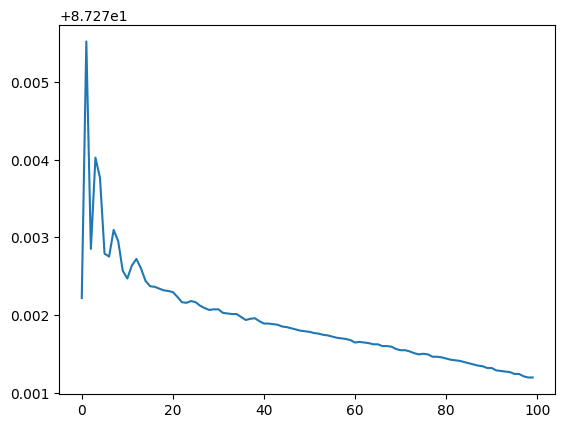

In [ ]:
import matplotlib.pyplot as plt
plt.plot(losses)

In [ ]:
from sklearn.metrics import mean_squared_error
import numpy as np

# Testing loop
model.eval()
with torch.no_grad():
    predictions = model(X_test)
    test_loss = criterion(predictions, y_test).item()

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_test.numpy(), predictions.numpy()))
print(f'Test Loss: {test_loss:.4f}, RMSE: {rmse:.4f}')

Test Loss: 93.1381, RMSE: 9.6508


In [ ]:
torch.save(model.state_dict(), 'model_second.pth')

In [ ]:
test_df = pd.read_csv('Test.csv')
test_df.head()

,ID_Zindi,Date,ID,LAT,LON,Precipitation,LST,AAI,CloudFraction,NO2_strat,NO2_total,NO2_trop,TropopausePressure
0,ID_2MYNQS,1/1/19,PD03,45.289376,11.642394,3.277529,NaN,-0.313361,0.771456,0.000024,0.000075,NaN,14440.02819
1,ID_P4U5WU,1/1/19,TV03,45.836941,12.510362,0.000000,NaN,-0.229512,0.398208,0.000023,0.000120,NaN,14434.04790
2,ID_U4KWPK,1/1/19,X5561,45.582894,8.842165,0.000000,282.98,-0.470822,0.153694,0.000023,0.000171,0.000148,14427.42478
3,ID_QGSNTZ,1/1/19,X5953,45.131947,10.015742,1.928031,NaN,0.132952,0.756917,0.000024,0.000266,NaN,14443.09006
4,ID_GHSZ6K,1/1/19,X6701,45.186329,9.146666,0.000000,NaN,-0.198272,0.678858,0.000023,0.000149,NaN,14440.85840


In [68]:
idzindi = test_df['ID_Zindi']

In [ ]:
#test_df = test_df[['NO2_trop', 'NO2_total', 'AAI', 'LAT']]

In [69]:
test_df.drop(columns=['ID_Zindi', 'Date', 'ID'], inplace=True)

In [70]:
test_df.head()

,LAT,LON,Precipitation,LST,AAI,CloudFraction,NO2_strat,NO2_total,NO2_trop,TropopausePressure
0,45.289376,11.642394,3.277529,NaN,-0.313361,0.771456,0.000024,0.000075,NaN,14440.02819
1,45.836941,12.510362,0.000000,NaN,-0.229512,0.398208,0.000023,0.000120,NaN,14434.04790
2,45.582894,8.842165,0.000000,282.98,-0.470822,0.153694,0.000023,0.000171,0.000148,14427.42478
3,45.131947,10.015742,1.928031,NaN,0.132952,0.756917,0.000024,0.000266,NaN,14443.09006
4,45.186329,9.146666,0.000000,NaN,-0.198272,0.678858,0.000023,0.000149,NaN,14440.85840


In [71]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)
test_df = pd.DataFrame(imputer.fit_transform(test_df), columns=test_df.columns)

In [72]:
test_df.head()

,LAT,LON,Precipitation,LST,AAI,CloudFraction,NO2_strat,NO2_total,NO2_trop,TropopausePressure
0,45.289376,11.642394,3.277529,285.168,-0.313361,0.771456,0.000024,0.000075,0.000235,14440.02819
1,45.836941,12.510362,0.000000,293.600,-0.229512,0.398208,0.000023,0.000120,0.000110,14434.04790
2,45.582894,8.842165,0.000000,282.980,-0.470822,0.153694,0.000023,0.000171,0.000148,14427.42478
3,45.131947,10.015742,1.928031,287.844,0.132952,0.756917,0.000024,0.000266,0.000106,14443.09006
4,45.186329,9.146666,0.000000,290.044,-0.198272,0.678858,0.000023,0.000149,0.000129,14440.85840


STOPPER

In [ ]:
from sklearn.metrics import mean_squared_error
import numpy as np
import torch
scaler = StandardScaler()
X_test = scaler.fit_transform(test_df)
X_test = torch.tensor(X_test, dtype=torch.float32)
X_test

tensor([[-0.2316, -0.7540,  1.4153, -0.2833],
        [-0.6259, -0.1890,  1.5410,  1.8175],
        [ 1.1891,  0.4556,  1.1792,  0.8429],
        ...,
        [-0.5371, -0.2356, -0.3099, -0.8872],
        [ 0.5348,  7.7866,  0.3483, -0.6786],
        [ 0.2271,  4.4624,  0.6184, -0.8113]])

In [ ]:
model.eval()
with torch.no_grad():
    predictions = model(X_test)

# Store the predictions in test_df
predictions = predictions.numpy()


In [ ]:
predictions

array([[21.294874],
       [14.238974],
       [38.869827],
       ...,
       [17.306107],
       [37.28898 ],
       [36.161217]], dtype=float32)

In [ ]:
predictions_flattened = [item for sublist in predictions for item in sublist]

In [ ]:
combined_df = pd.DataFrame({'ID_Zindi': idzindi, 'Values': predictions_flattened})
combined_df

,ID_Zindi,Values
0,ID_2MYNQS,21.294874
1,ID_P4U5WU,14.238974
2,ID_U4KWPK,38.869827
3,ID_QGSNTZ,41.331596
4,ID_GHSZ6K,29.545950
...,...,...
6571,ID_GUSXU9,24.787703
6572,ID_GMVEG1,43.222496
6573,ID_GD6HNP,17.306107
6574,ID_J7YW1Y,37.288979


In [ ]:
combined_df.to_csv('combined_df_3.csv', index=False)

# **EDA 1**

In [ ]:
df = pd.read_csv('KNN_Zindi.csv')
df.head()

,LAT,LON,Precipitation,LST,AAI,CloudFraction,NO2_strat,NO2_total,NO2_trop,TropopausePressure,GT_NO2
0,45.601585,11.903551,0.000000,291.700,0.230527,0.559117,0.000024,0.000117,0.000143,14440.82126,31.0
1,45.371005,11.840830,3.047342,285.500,-0.074006,0.869309,0.000024,0.000127,0.000132,14441.79815,42.0
2,45.045825,12.060869,0.000000,279.816,0.024470,0.674160,0.000024,0.000086,0.000117,14437.38294,31.0
3,45.104075,11.553241,1.200467,295.088,-0.010442,0.920054,0.000024,0.000124,0.000138,14440.83831,30.0
4,45.038758,11.790152,1.274564,286.804,-0.176178,0.747464,0.000024,0.000116,0.000252,14438.79037,58.0


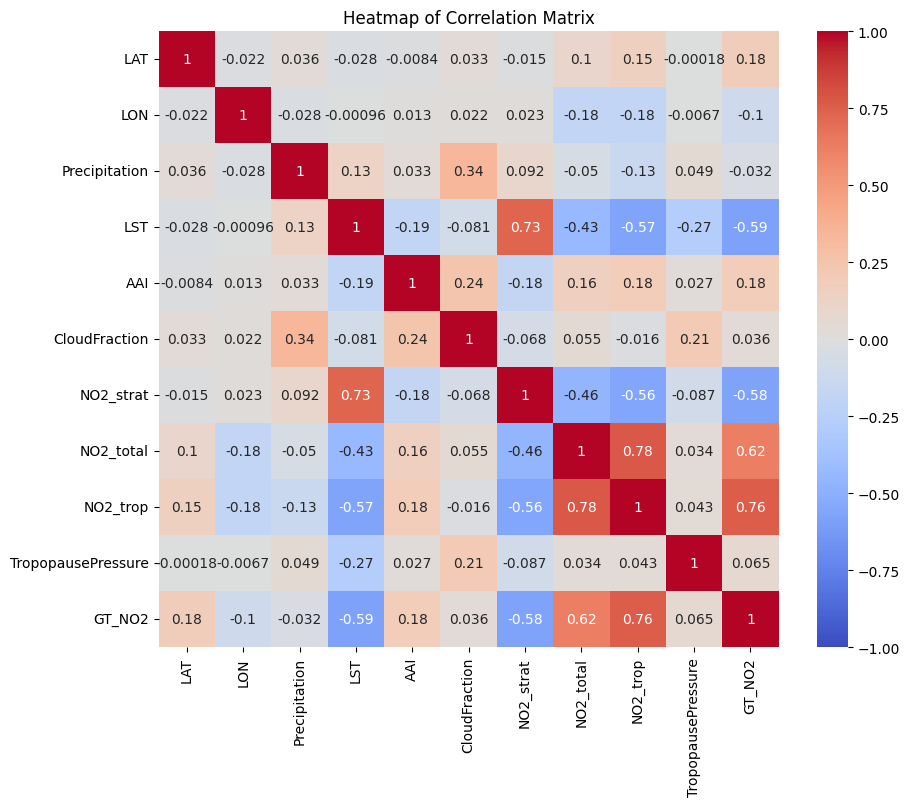

In [ ]:
corr = df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Heatmap of Correlation Matrix')
plt.show()

In [ ]:
import pandas as pd
import numpy as np
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import StandardScaler

In [ ]:
scaler = StandardScaler()
X = df.drop(columns=['GT_NO2'])
y = df['GT_NO2']
df_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

vif_data = pd.DataFrame()
vif_data["Feature"] = df_scaled.columns
vif_data["VIF"] = [variance_inflation_factor(df_scaled.values, i) for i in range(df_scaled.shape[1])]
print(vif_data)

              Feature       VIF
0                 LAT  1.038520
1                 LON  1.061413
2       Precipitation  1.176694
3                 LST  2.653535
4                 AAI  1.119201
5       CloudFraction  1.278723
6           NO2_strat  2.358570
7           NO2_total  2.574417
8            NO2_trop  3.274489
9  TropopausePressure  1.174632


In [ ]:
df = df_scaled
df['GT_NO2'] = y
df.head()

,LAT,LON,Precipitation,LST,AAI,CloudFraction,NO2_strat,NO2_total,NO2_trop,TropopausePressure,GT_NO2
0,0.802939,1.758820,-0.337841,-0.639490,2.265826,1.343774,-1.735844,-0.436373,0.406457,-0.806774,31.0
1,-0.208916,1.700226,0.062563,-1.243798,1.803138,2.559418,-1.727517,-0.338033,0.273770,-0.806429,42.0
2,-1.635904,1.905784,-0.337841,-1.797812,1.952756,1.794630,-1.719191,-0.739261,0.096932,-0.807987,31.0
3,-1.380286,1.431565,-0.180106,-0.309265,1.899714,2.758288,-1.710864,-0.367535,0.348056,-0.806768,30.0
4,-1.666915,1.652884,-0.170370,-1.116698,1.647904,2.081906,-1.710864,-0.446208,1.675157,-0.807490,58.0


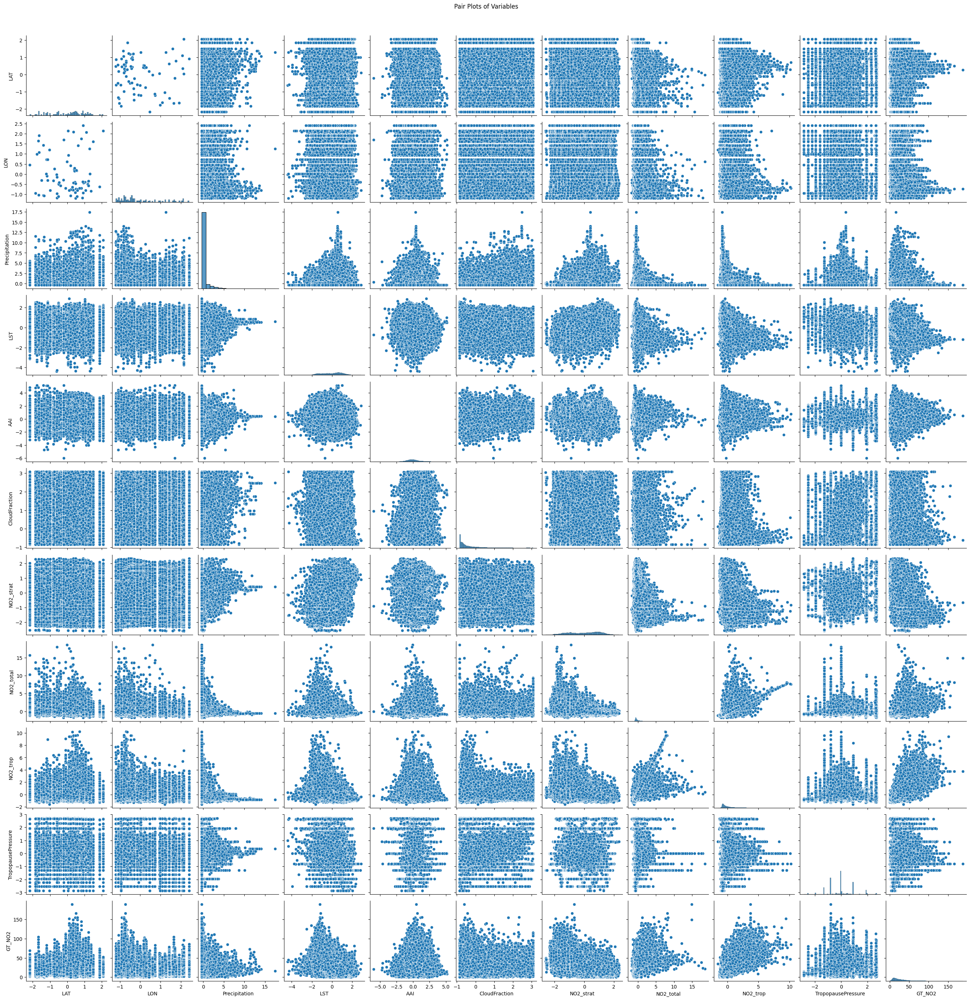

In [ ]:
sns.pairplot(df)
plt.suptitle('Pair Plots of Variables', y=1.02)
plt.show()

In [ ]:
def transform_skewed_features(df, skew_threshold=0.5):
    # Copy the dataframe to avoid modifying the original data
    df_transformed = df.copy()

    # Identify skewed features
    skewed_features = df_transformed.apply(lambda x: x.skew()).sort_values(ascending=False)
    skewed_features = skewed_features[abs(skewed_features) > skew_threshold]

    for feature in skewed_features.index:
        if df_transformed[feature].min() > 0:
            # Apply Box-Cox transformation for positive data
            df_transformed[feature], _ = boxcox(df_transformed[feature])
        else:
            # Apply log transformation for data with non-positive values
            df_transformed[feature] = np.log1p(df_transformed[feature] - df_transformed[feature].min() + 1)

    return df_transformed

In [ ]:
df_transformed = transform_skewed_features(df)

In [ ]:
df_transformed.head()

,LAT,LON,Precipitation,LST,AAI,CloudFraction,NO2_strat,NO2_total,NO2_trop,TropopausePressure,GT_NO2
0,0.802939,1.601127,0.693147,-0.639490,2.265826,1.432984,-1.735844,1.184057,1.378231,-0.806774,3.496508
1,-0.208916,1.589240,0.875637,-1.243798,1.803138,1.687663,-1.727517,1.213709,1.344218,-0.806429,3.784190
2,-1.635904,1.630334,0.693147,-1.797812,1.952756,1.535154,-1.719191,1.086781,1.297012,-0.807987,3.496508
3,-1.380286,1.532851,0.769059,-0.309265,1.899714,1.723784,-1.710864,1.204905,1.363403,-0.806768,3.465736
4,-1.666915,1.579531,0.773561,-1.116698,1.647904,1.595201,-1.710864,1.181043,1.655668,-0.807490,4.094345


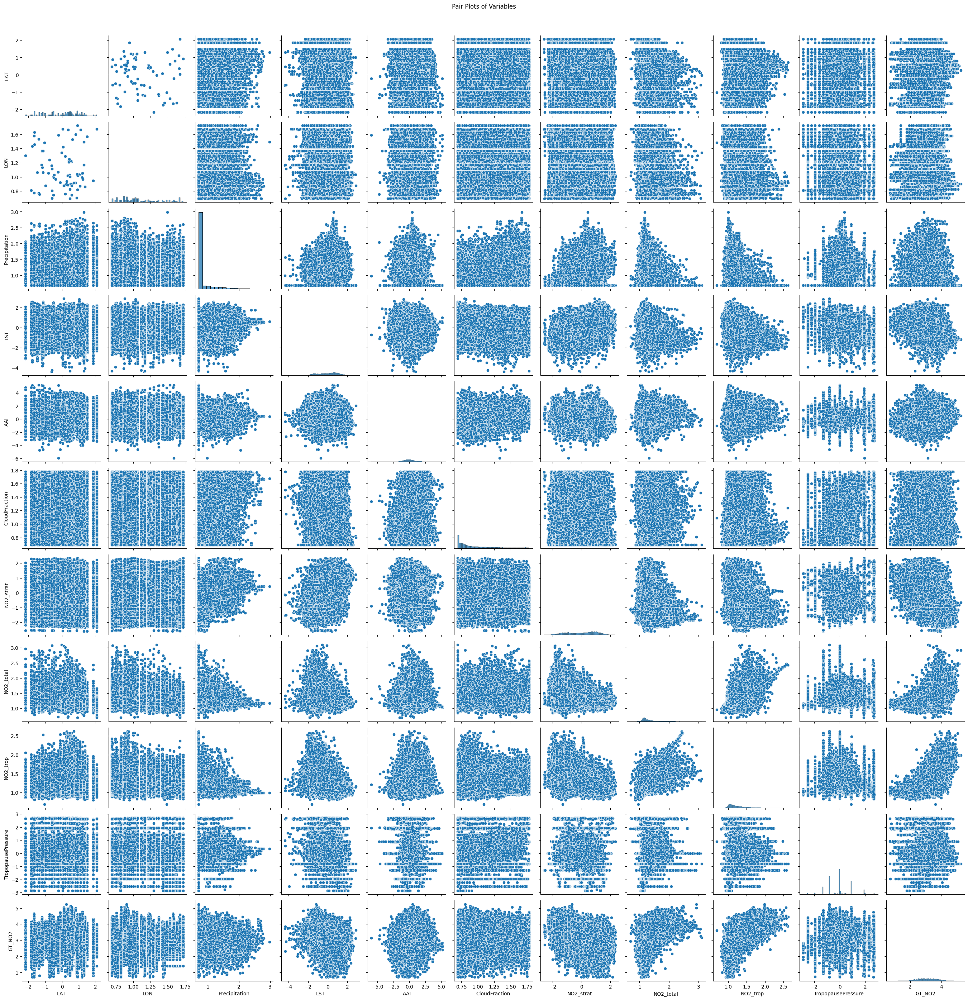

In [ ]:
sns.pairplot(df_transformed)
plt.suptitle('Pair Plots of Variables', y=1.02)
plt.show()

In [ ]:
df = df_transformed

In [ ]:
from scipy import stats
df.drop(columns=['GT_NO2'], inplace=True)
df['GT_NO2'] = y
# Remove outliers using Z-score
df = df[(np.abs(stats.zscore(df)) < 3).all(axis=1)]
df.head()

,LAT,LON,Precipitation,LST,AAI,CloudFraction,NO2_strat,NO2_total,NO2_trop,TropopausePressure,GT_NO2
0,0.802939,1.758820,-0.337841,-0.639490,2.265826,1.343774,-1.735844,-0.436373,0.406457,-0.806774,31.0
1,-0.208916,1.700226,0.062563,-1.243798,1.803138,2.559418,-1.727517,-0.338033,0.273770,-0.806429,42.0
2,-1.635904,1.905784,-0.337841,-1.797812,1.952756,1.794630,-1.719191,-0.739261,0.096932,-0.807987,31.0
3,-1.380286,1.431565,-0.180106,-0.309265,1.899714,2.758288,-1.710864,-0.367535,0.348056,-0.806768,30.0
4,-1.666915,1.652884,-0.170370,-1.116698,1.647904,2.081906,-1.710864,-0.446208,1.675157,-0.807490,58.0


In [ ]:
df.shape

(76089, 11)

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler

X = df.drop('GT_NO2', axis=1)
y = df['GT_NO2']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error

# Initialize the model
xgb_model = XGBRegressor(random_state=42)

# Train the model
xgb_model.fit(X_train, y_train)

# Predict and evaluate
y_pred_xgb = xgb_model.predict(X_test)
mse_xgb = mean_squared_error(y_test, y_pred_xgb)
print('XGBoost MSE:', mse_xgb)

# Cross-validation
cv_scores_xgb = cross_val_score(xgb_model, X, y, cv=5, scoring='neg_mean_squared_error')
print('XGBoost CV MSE:', -cv_scores_xgb.mean())

XGBoost MSE: 43.79494770169141
XGBoost CV MSE: 57.5675836899945


In [ ]:
from sklearn.ensemble import RandomForestRegressor

# Initialize the model
rf_model = RandomForestRegressor(random_state=42)

# Train the model
rf_model.fit(X_train, y_train)

# Predict and evaluate
y_pred_rf = rf_model.predict(X_test)
mse_rf = mean_squared_error(y_test, y_pred_rf)
print('Random Forest MSE:', mse_rf)

# Cross-validation
cv_scores_rf = cross_val_score(rf_model, X, y, cv=5, scoring='neg_mean_squared_error')
print('Random Forest CV MSE:', -cv_scores_rf.mean())

Random Forest MSE: 46.96633155666005
Random Forest CV MSE: 58.74737945395822


In [ ]:
from sklearn.linear_model import LinearRegression

# Initialize the model
lin_model = LinearRegression()

# Train the model
lin_model.fit(X_train, y_train)

# Predict and evaluate
y_pred_lin = lin_model.predict(X_test)
mse_lin = mean_squared_error(y_test, y_pred_lin)
print('Linear Regression MSE:', mse_lin)

# Cross-validation
cv_scores_lin = cross_val_score(lin_model, X, y, cv=5, scoring='neg_mean_squared_error')
print('Linear Regression CV MSE:', -cv_scores_lin.mean())

Linear Regression MSE: 80.62803285864837
Linear Regression CV MSE: 85.11920091340622


In [ ]:
scaler = StandardScaler()
test_df = scaler.fit_transform(test_df)
test_df

array([[-0.28325289,  0.88229558,  0.09813178, ..., -0.73669687,
         2.64754014, -0.79658255],
       [ 1.81753777,  1.54670735, -0.34034783, ..., -0.1739109 ,
         0.51017428, -0.79868552],
       [ 0.84286086, -1.26122294, -0.34034783, ...,  0.4681939 ,
         1.16048287, -0.80101454],
       ...,
       [-0.88724666, -0.36287409, -0.34034783, ..., -0.41060835,
        -0.51473128,  0.25254005],
       [-0.67860369, -1.02813387, -0.34034783, ...,  7.77056218,
         0.25163027, -1.28073601],
       [-0.8112954 ,  0.22322797, -0.34034783, ...,  4.45931588,
         0.35223239, -1.28043145]])

In [ ]:
tester = pd.DataFrame(test_df)
tester.head()

,0,1,2,3,4,5,6,7,8,9
0,-0.283253,0.882296,0.098132,-1.398418,1.457615,2.108412,-1.824828,-0.736697,2.647540,-0.796583
1,1.817538,1.546707,-0.340348,-0.506154,1.585014,0.689462,-1.875579,-0.173911,0.510174,-0.798686
2,0.842861,-1.261223,-0.340348,-1.629950,1.218373,-0.240091,-1.917871,0.468194,1.160483,-0.801015
3,-0.887247,-0.362874,-0.082409,-1.115247,2.135734,2.053140,-1.833286,1.664271,0.445281,-0.795506
4,-0.678604,-1.028134,-0.340348,-0.882446,1.632479,1.756386,-1.867120,0.191208,0.841166,-0.796291


In [ ]:
new_tester = transform_skewed_features(tester)
new_tester.head()

,0,1,2,3,4,5,6,7,8,9
0,0.957046,0.882296,0.891375,-1.398418,1.970074,1.595905,-1.824828,1.055799,1.821591,-0.796583
1,1.548580,1.546707,0.693147,-0.506154,1.987683,1.256710,-1.875579,1.234615,1.397313,-0.798686
2,1.316437,-1.261223,0.693147,-1.629950,1.936143,0.949450,-1.917871,1.405891,1.546418,-0.801015
3,0.693147,-0.362874,0.814452,-1.115247,2.060427,1.584637,-1.833286,1.663024,1.381137,-0.795506
4,0.792378,-1.028134,0.693147,-0.882446,1.994165,1.521866,-1.867120,1.335573,1.475977,-0.796291


In [ ]:
original_columns = ['LAT', 'LON', 'Precipitation', 'LST', 'AAI', 'CloudFraction', 'NO2_strat', 'NO2_total', 'NO2_trop', 'TropopausePressure']
new_tester.columns = original_columns
predictions = xgb_model.predict(new_tester)
predictions

array([57.614098, 51.52114 , 65.41782 , ..., 44.082504, 56.467796,
       46.768593], dtype=float32)

In [ ]:
combined_df = pd.DataFrame({'ID_Zindi': idzindi, 'Values': predictions})
combined_df

,ID_Zindi,Values
0,ID_2MYNQS,57.614098
1,ID_P4U5WU,51.521141
2,ID_U4KWPK,65.417824
3,ID_QGSNTZ,64.498077
4,ID_GHSZ6K,71.364540
...,...,...
6571,ID_GUSXU9,47.447723
6572,ID_GMVEG1,60.878002
6573,ID_GD6HNP,44.082504
6574,ID_J7YW1Y,56.467796


In [ ]:
combined_df.to_csv('combined_df_4.csv', index=False)

# **Another Take**

In [2]:
!unzip zindi.zip

Archive:  zindi.zip
  inflating: manifest-0e3f74fe598af08986d762221d01a08120240710-12938-ady2o0.json  
  inflating: Test.csv                
  inflating: Train.csv               
  inflating: SampleSubmission.csv    
  inflating: DataDescription.pdf     


In [42]:
df = pd.read_csv('KNN_Zindi.csv')
df.head()

,LAT,LON,Precipitation,LST,AAI,CloudFraction,NO2_strat,NO2_total,NO2_trop,TropopausePressure,GT_NO2
0,45.601585,11.903551,0.000000,291.700,0.230527,0.559117,0.000024,0.000117,0.000143,14440.82126,31.0
1,45.371005,11.840830,3.047342,285.500,-0.074006,0.869309,0.000024,0.000127,0.000132,14441.79815,42.0
2,45.045825,12.060869,0.000000,279.816,0.024470,0.674160,0.000024,0.000086,0.000117,14437.38294,31.0
3,45.104075,11.553241,1.200467,295.088,-0.010442,0.920054,0.000024,0.000124,0.000138,14440.83831,30.0
4,45.038758,11.790152,1.274564,286.804,-0.176178,0.747464,0.000024,0.000116,0.000252,14438.79037,58.0


In [56]:
final_losses_train = []
final_losses_test = []

In [44]:
df = df.dropna(subset=['GT_NO2'])

In [45]:
from sklearn.preprocessing import StandardScaler
X = df.drop(columns=['GT_NO2'])
y = df['GT_NO2']

In [46]:
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset

In [47]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.05, random_state=1)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [48]:
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32).view(-1, 1)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32).view(-1, 1)

In [49]:
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

In [50]:
class RegressionModel(nn.Module):
    def __init__(self, input_dim):
        super(RegressionModel, self).__init__()
        self.layer1 = nn.Linear(input_dim, 64)
        self.layer2 = nn.Linear(64, 32)
        self.layer3 = nn.Linear(32, 16)
        self.output = nn.Linear(16, 1)

    def forward(self, x):
        x = torch.relu(self.layer1(x))
        x = torch.relu(self.layer2(x))
        x = torch.relu(self.layer3(x))
        x = self.output(x)
        return x

In [51]:
input_dim = X_train.shape[1]
model = RegressionModel(input_dim)

In [52]:
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=3e-6)

In [53]:
df.isna().sum()

LAT                   0
LON                   0
Precipitation         0
LST                   0
AAI                   0
CloudFraction         0
NO2_strat             0
NO2_total             0
NO2_trop              0
TropopausePressure    0
GT_NO2                0
dtype: int64

In [63]:
import torch
from sklearn.metrics import mean_squared_error
import time

# Initialize lists to store loss values
train_losses = []
test_losses = []

num_epochs = 50
for epoch in range(num_epochs):
    start_time = time.time()

    model.train()
    for X_batch, y_batch in train_loader:
        optimizer.zero_grad()
        outputs = model(X_batch)
        loss = criterion(outputs, y_batch)
        loss.backward()
        optimizer.step()

    # Evaluate on training data
    model.eval()
    with torch.no_grad():
        train_predictions = model(X_train_tensor)
        train_loss = criterion(train_predictions, y_train_tensor)
        train_rmse = train_loss.sqrt().item()
        train_losses.append(train_rmse)

    # Evaluate on test data
    all_predictions = []
    all_targets = []
    with torch.no_grad():
        for X_batch, y_batch in test_loader:
            predictions = model(X_batch)
            all_predictions.append(predictions)
            all_targets.append(y_batch)

    all_predictions = torch.cat(all_predictions)
    all_targets = torch.cat(all_targets)

    # Ensure there are no NaNs in predictions or targets
    if torch.isnan(all_predictions).any() or torch.isnan(all_targets).any():
        print("NaN values found in predictions or targets")
        break

    mse = mean_squared_error(all_targets.numpy(), all_predictions.numpy())
    rmse = mse ** 0.5
    test_losses.append(rmse)

    end_time = time.time()
    epoch_time = end_time - start_time

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Train RMSE: {train_rmse:.4f}, Test RMSE: {rmse:.4f}, Time: {epoch_time:.2f} seconds')

Epoch [1/50], Loss: 78.4613, Train RMSE: 7.8236, Test RMSE: 8.1078, Time: 12.27 seconds
Epoch [2/50], Loss: 37.9668, Train RMSE: 7.7291, Test RMSE: 7.9422, Time: 9.90 seconds
Epoch [3/50], Loss: 25.2130, Train RMSE: 7.6832, Test RMSE: 7.8967, Time: 10.12 seconds
Epoch [4/50], Loss: 189.4894, Train RMSE: 7.7083, Test RMSE: 7.9352, Time: 10.00 seconds
Epoch [5/50], Loss: 57.0707, Train RMSE: 7.7216, Test RMSE: 7.9371, Time: 8.79 seconds
Epoch [6/50], Loss: 69.4562, Train RMSE: 7.7109, Test RMSE: 7.8793, Time: 10.16 seconds
Epoch [7/50], Loss: 43.5421, Train RMSE: 7.7106, Test RMSE: 7.9331, Time: 10.14 seconds
Epoch [8/50], Loss: 43.2701, Train RMSE: 7.7130, Test RMSE: 7.8996, Time: 9.23 seconds
Epoch [9/50], Loss: 53.8808, Train RMSE: 7.6966, Test RMSE: 7.9098, Time: 9.60 seconds
Epoch [10/50], Loss: 32.7593, Train RMSE: 7.7035, Test RMSE: 7.9239, Time: 10.28 seconds
Epoch [11/50], Loss: 40.6368, Train RMSE: 7.7589, Test RMSE: 7.9569, Time: 10.29 seconds
Epoch [12/50], Loss: 32.2839, Tra

In [57]:
final_losses_train.append(train_losses)
final_losses_test.append(test_losses)

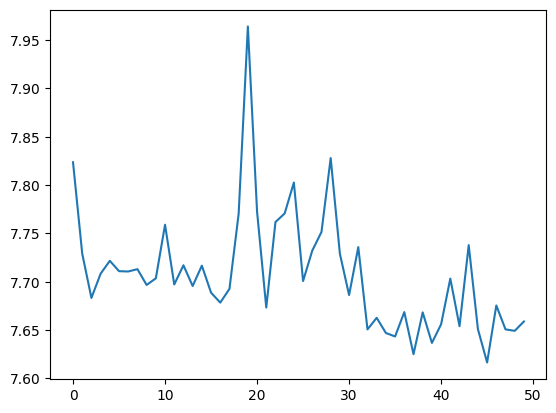

In [64]:
plt.plot(train_losses)
plt.show()

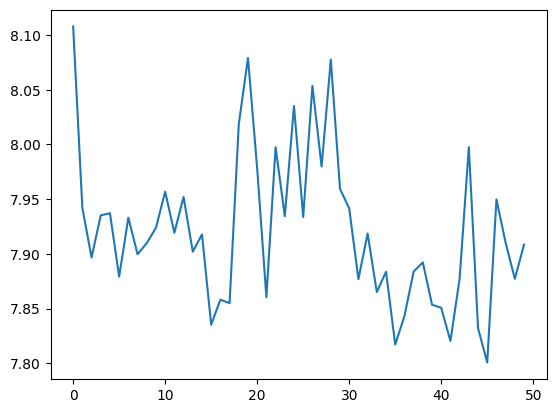

In [65]:
plt.plot(test_losses)
plt.show()

In [66]:
torch.save(model.state_dict(), 'model_large.pth')

In [67]:
test_df = pd.read_csv('Test.csv')
test_df.head()

,ID_Zindi,Date,ID,LAT,LON,Precipitation,LST,AAI,CloudFraction,NO2_strat,NO2_total,NO2_trop,TropopausePressure
0,ID_2MYNQS,1/1/19,PD03,45.289376,11.642394,3.277529,NaN,-0.313361,0.771456,0.000024,0.000075,NaN,14440.02819
1,ID_P4U5WU,1/1/19,TV03,45.836941,12.510362,0.000000,NaN,-0.229512,0.398208,0.000023,0.000120,NaN,14434.04790
2,ID_U4KWPK,1/1/19,X5561,45.582894,8.842165,0.000000,282.98,-0.470822,0.153694,0.000023,0.000171,0.000148,14427.42478
3,ID_QGSNTZ,1/1/19,X5953,45.131947,10.015742,1.928031,NaN,0.132952,0.756917,0.000024,0.000266,NaN,14443.09006
4,ID_GHSZ6K,1/1/19,X6701,45.186329,9.146666,0.000000,NaN,-0.198272,0.678858,0.000023,0.000149,NaN,14440.85840


In [73]:
X_test = scaler.transform(test_df)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
X_test_tensor

tensor([[-5.6651e-01,  1.5141e+00,  9.3457e-02,  ..., -8.4691e-01,
          1.4718e+00, -8.0716e-01],
        [ 1.8373e+00,  2.3248e+00, -3.3750e-01,  ..., -4.0774e-01,
          1.9652e-02, -8.0928e-01],
        [ 7.2201e-01, -1.1013e+00, -3.3750e-01,  ...,  9.3327e-02,
          4.6147e-01, -8.1161e-01],
        ...,
        [-1.2576e+00, -5.1811e-03, -3.3750e-01,  ..., -5.9245e-01,
         -6.7667e-01,  2.4634e-01],
        [-1.0189e+00, -8.1691e-01, -3.3750e-01,  ...,  5.7917e+00,
         -1.5600e-01, -1.2933e+00],
        [-1.1707e+00,  7.0997e-01, -3.3750e-01,  ...,  3.2078e+00,
         -8.7653e-02, -1.2930e+00]])

In [74]:
def predict(model, test_tensor):
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():  # Disable gradient computation
        predictions = model(test_tensor)
    return predictions.numpy()  # Convert the predictions to a NumPy array

# Example usage
predictions = predict(model, X_test_tensor)
print(predictions)

[[51.985   ]
 [32.335087]
 [37.293945]
 ...
 [14.369086]
 [32.081894]
 [25.088907]]


In [76]:
predictions_flattened = [item for sublist in predictions for item in sublist]
combined_df = pd.DataFrame({'ID_Zindi': idzindi, 'Values': predictions_flattened})
combined_df

,ID_Zindi,Values
0,ID_2MYNQS,51.985001
1,ID_P4U5WU,32.335087
2,ID_U4KWPK,37.293945
3,ID_QGSNTZ,29.905960
4,ID_GHSZ6K,31.116632
...,...,...
6571,ID_GUSXU9,41.451836
6572,ID_GMVEG1,33.743858
6573,ID_GD6HNP,14.369086
6574,ID_J7YW1Y,32.081894


In [77]:
combined_df.to_csv('combined_df_5.csv', index=False)